# Convolution Neural Network Architectures

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
<!--     The architectures of CNN in the image processing can be divided  -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The main tendencies in the modern state of CNN Architectures are:<ul>
    <li> <b>Optimization of the backbone structure</b> (search for the best for common datasets such as ImageNet and COCO).
    <li> <b>Optimization of head part for different tasks</b> (i.e. classification, localization, object detection,
        semantic segmentation, instance  segmentation, panoptic segmentation, style-transfer, GAN and so on).   
    <li> Optimization of the computational cost (or costless architectures) for small devices like CPU or Raspberry Pi (<b>HardWare Specific Optimization</b>).
    <li> Using of new layer structures as attention mechanisms and transformer layers in the backbone instead of convolutions.
    <li> Use of Atuo search of architectures (Like an AutoML, NAS, NetAdpat, and e.t.c. - as optimization of model as its self (wider,deeper and e.t.c., as hyperparameter optimization.).         
        

## Backbones of CNN.

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The aim of the backbone consists in feature extractor.
    <br> After backbone you may several head layers for specific tasks. 
    <br> In most cases backbones are tested for the classification task on the large datasets like ImageNet.

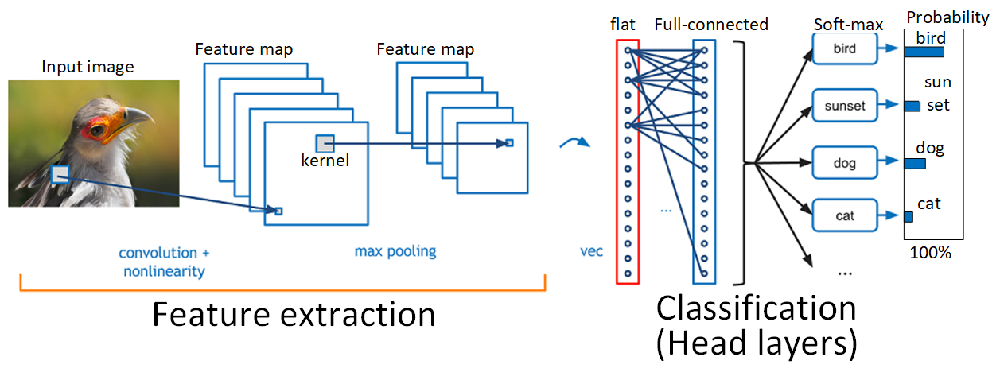

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
Top-1 accuracy on the imageNet (taken here https://paperswithcode.com/sota/image-classification-on-imagenet).

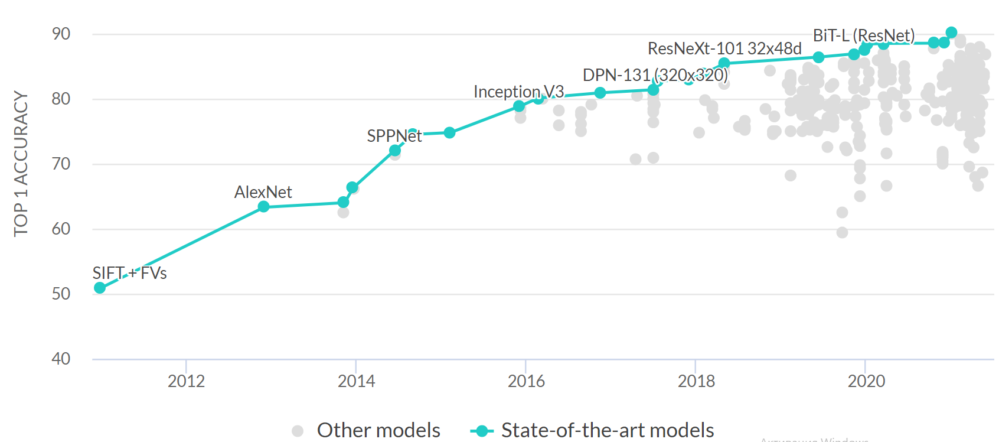

<!-- https://paperswithcode.com/sota/image-classification-on-imagenet -->

### ResNet, DenseNet and other skip-connection variants

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>ResNet</b>(2015).<br>
<b>The degradation problem</b> - While expecting that the model will converge with higher accuracy with increasing of number of layers (using batchnorm, L2 and e.t.c.) , on the practice, it cold lead to reducing precision (increasing of the variance) in comparison with their shallower counterpart. <ul> In other words, In the limit, simply stacking more layers degrades the model's ultimate performance.</ul>
        <blockquote> 
    It could be explained as by increasing the the layers we need to provide that  during the training our new model need to include the previous result but not shift it. The last can be due to vanishing and other problems with weights updating.<br>
    In other words for non-nested function classes, a larger function class does not always move closer to the "truth" function.
  <!--  http://d2l.ai/chapter_convolutional-modern/resnet.html -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
We can regularize the all model behavior if:<ul>
    <il> New layer will be copy of previous one (hard to provide it on practice).
    <li> New layer will be identity ($f(x)=x$). However, if simply use identity layer, then accuracy will not increase. </ul>
The solution is to use combination of identity in parallel with conventional block i.e.<br> <b>Residual Block</b><ul>
    <li> Residual function can be considered as a refinement step in which we learn how to adjust the input feature map for the output one.
        <ul> Here the also idea that every additional layer should more easily reduce to the identity function then the rest one.<br>
    In other words if the layer is no layer work is need, then their weights need to be gradually reduced to zero and res only the identity part.
        </ul>
    <li> The original resnet was vggnet adaptation.    
    <li> There was proposed a several variants `ResNet-18,-34, -50, -101, -151`.
    <ul> Later it was also proposed the `ResNet-1001`, however it accuracy does not dramatically higher then for ResNet-151, thus it it not popular solution up-to-day.</ul>
    <li> Each resnet block need to have the same channels and feature map size on the input and the output.
        <ul> In the identity part: either use corresponding structure of convolutions or padd rest channels with zeros, or use 1x1 conv .</ul>
    <li> The other ideas under resnet are:<ul>
        <li> when introducing $n$ skip-residual blocks, the networks utilize $2^n$ different paths and therefore features can be learned with a large range of different receptive fields.
        <li> During the back propagation identity work as negative feedback allowing to reduce or get around layers with zero-gradient (vanishing gradient). <ul>
            <li> The idea is similar to the HighWayNet (2015) where it was proposed to use in parallel two connection with weights $(1-a)$ and $a$.    
    </ul>

<!--
c
https://theaisummer.com/cnn-architectures/
https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d#71ae
https://theaisummer.com/receptive-field/
https://fleuret.org/dlc/materials/dlc-slides-6-5-residual-networks.pdf
https://towardsdatascience.com/resnet-with-identity-mapping-over-1000-layers-reached-image-classification-bb50a42af03e
-->

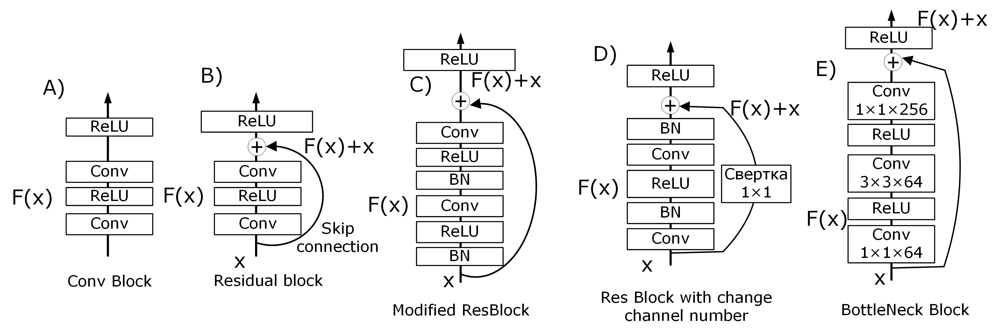

ResNet 18

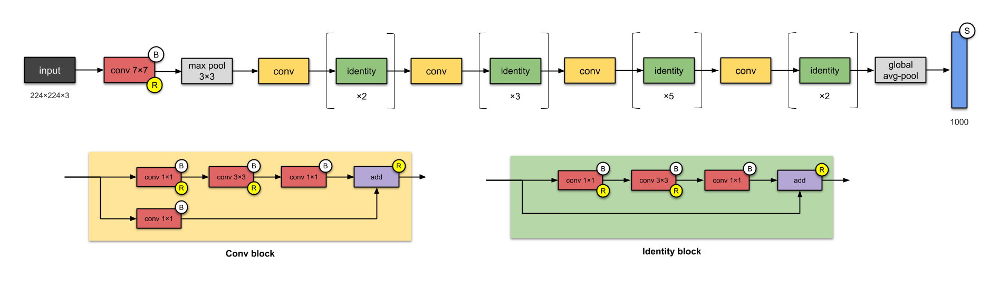

<!-- https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d#6872 -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The latter modification of residual layer is the following

<!-- https://arxiv.org/abs/1603.05027 -->


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
The other resnet-like ideas (or architectures) are:<ul>
    <li> <b>Wide ResNet</b> (with more wide layers).
    <li> <b>Stochastic Net</b> randomly dropping entire ResBlocks during training (with rest only identity part) rest all parts (without dropping) in evaluation. 
    <li> <b>ResNet in ResNet</b> the idea is similar to network in network, but with using of a identity paths.
     <li> <b>ResNeXt</b> (2017) replaces the standard residual block with one that leverages a "split-transform-merge" strategy (ie. branched paths within a cell) - like inception module.<ul>
         <li> The idea behind resNetXt is similar to group convolution, it was discovered that each group can learn different features. It is also was shown that increasing cardinality is more effective at benefiting model performance than increasing the width or depth of the network.
          <li> Each layer her proposed to have cardinality the same as expression power, by  experiments authors proposed the best cardinality layer architectures by their opinion.
         
  <!--       https://fleuret.org/dlc/materials/dlc-slides-6-5-residual-networks.pdf -->
 <!-- https://www.jeremyjordan.me/convnet-architectures/
https://arxiv.org/abs/1611.05431
https://towardsdatascience.com/review-densenet-image-classification-b6631a8ef803
https://towardsdatascience.com/resnet-with-identity-mapping-over-1000-layers-reached-image-classification-bb50a42af03e
-->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
 <b>Wide ResNet</b> (with more wide layers). <br>
    The main idea is to change from deep nn to wide one. <br>
        The networks contains 16-40 layers with number of parameters comparable to ResNet 50-150. <br>
            The networks was much simpler to train with accuracy a little higher. 
    <br>
    With Wide Trick you reduce receptive field and thus you does not able to make so-shallow network!
    <br>
    After this network it was discovered that  we need to search some trade-off between depth-width and input resolution (i.e. receptive field).

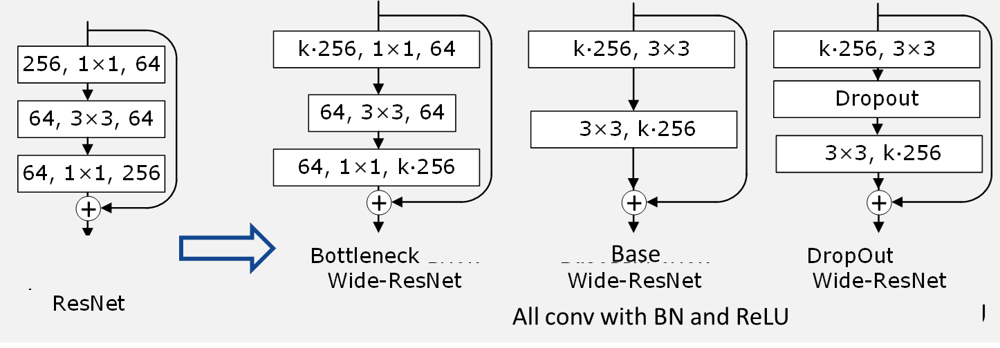

<!-- https://arxiv.org/abs/1605.07146 -->

<!-- RiR -->

<!-- ![image.png](attachment:image.png) -->
<!-- https://sh-tsang.medium.com/review-rir-resnet-in-resnet-image-classification-be4c79fde8ba -->


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>ResNeXt</b> (2017) replaces the standard residual block with one that leverages a "split-transform-merge" strategy (ie. branched paths within a cell) - like inception module.<ul>
         <li> The idea behind ResNetXt is similar to group convolution, it was discovered that each group can learn different features. It is also was shown that increasing cardinality is more effective at benefiting model performance than increasing the width or depth of the network.
          <li> Each layer her proposed to have cardinality the same as expression power, by  experiments authors proposed the best cardinality layer architectures by their opinion. <br>
<em>Note</em>    Was one of the rare network  for which you may together DropOut and BatchNorm, but we do not know why.

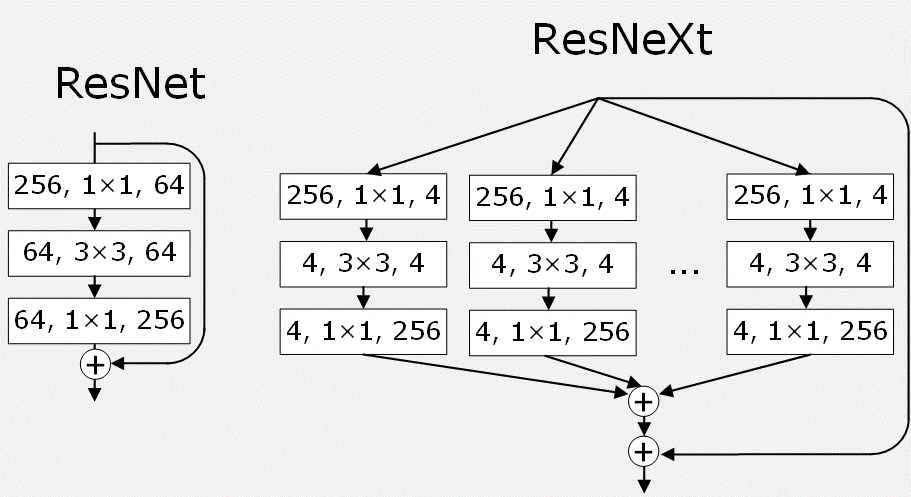

ReNetXt

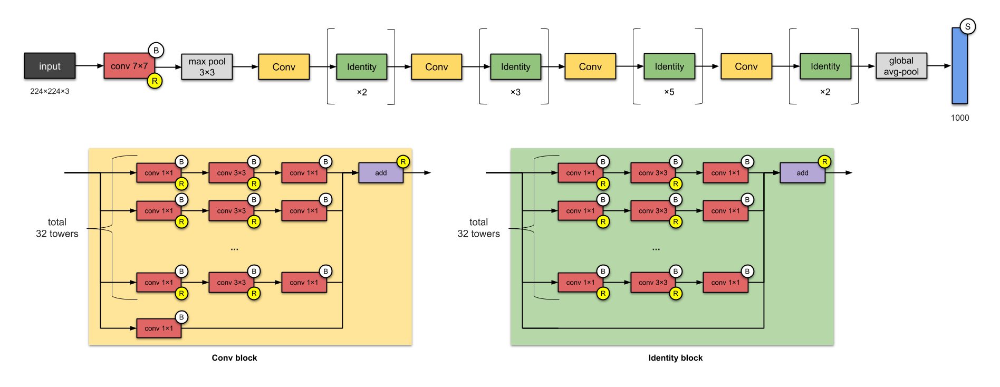

<!-- https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d#6872 -->

<!-- Stochastic net -->

<!-- ![image-2.png](attachment:image-2.png) -->
<!-- https://towardsdatascience.com/review-stochastic-depth-image-classification-a4e225807f4a -->



<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'><ul>
    <li>
        <b> Inception V4, Inception-ReNet V1,  Inception-ReNet V2 (2016)</b>
    The join together the resnet and inception V3 allow to obtain the new models.
    
<!-- 
 https://github.com/Dyakonov/DL   
https://arxiv.org/pdf/1605.07678.pdf
https://arxiv.org/abs/1602.07261
-->


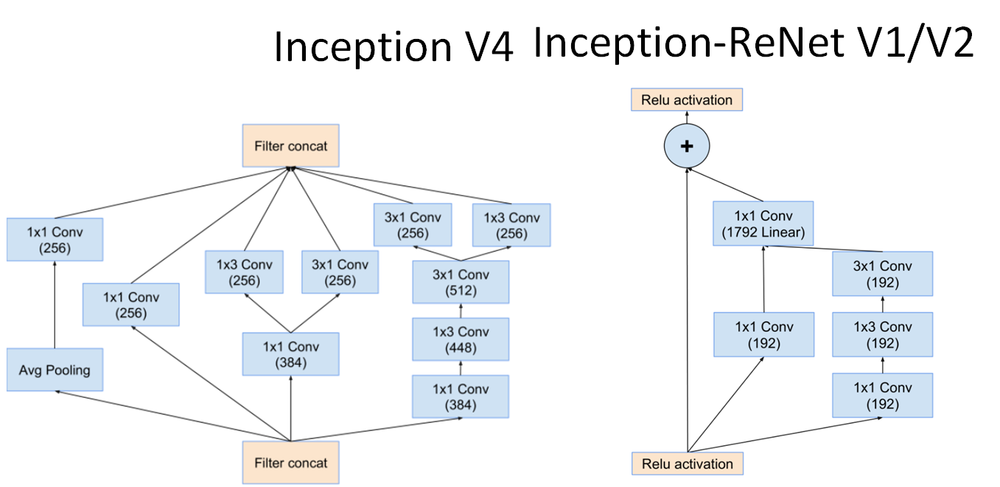

<!-- https://www.arxiv-vanity.com/papers/1602.07261/
https://towardsdatascience.com/review-inception-v4-evolved-from-googlenet-merged-with-resnet-idea-image-classification-5e8c339d18bc -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Xception (2016) </b><br>
Xception (eXtream Inception) is an adaptation from Inception, where the Inception modules have been replaced with depthwise separable convolutions.    
  <li> this means performing 1×1 to every channel, then performing a 3×3 to each output. This is identical to replacing the Inception module with depthwise separable convolutions.
<!--      https://arxiv.org/abs/1610.02357
      https://towardsdatascience.com/illustrated-10-cnn-architectures-95d78ace614d#6872 -->

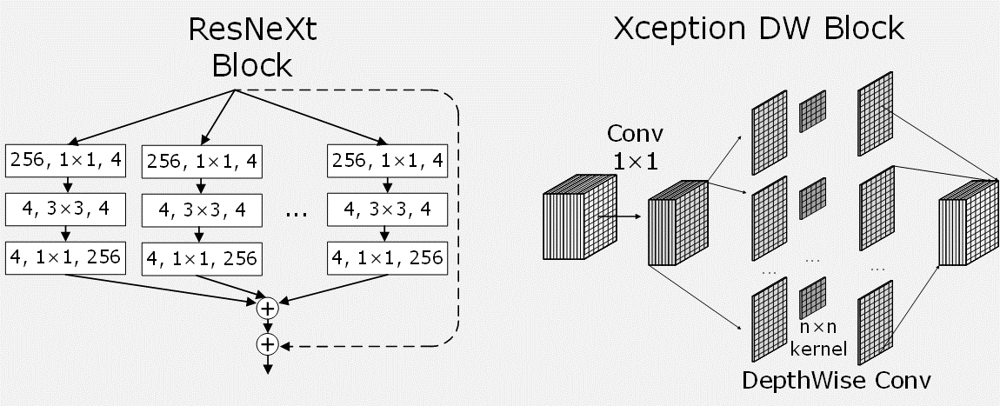

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Deepwise-Convolution</b> (for instance, $C \cdot 3\times 3\times 1$). 
        <ul> This is auxiliary (almost always intermediate operation which differs from conventional one in replacing $\sum$ operation with <b>concatenation</b>.)</ul>
    <div>
    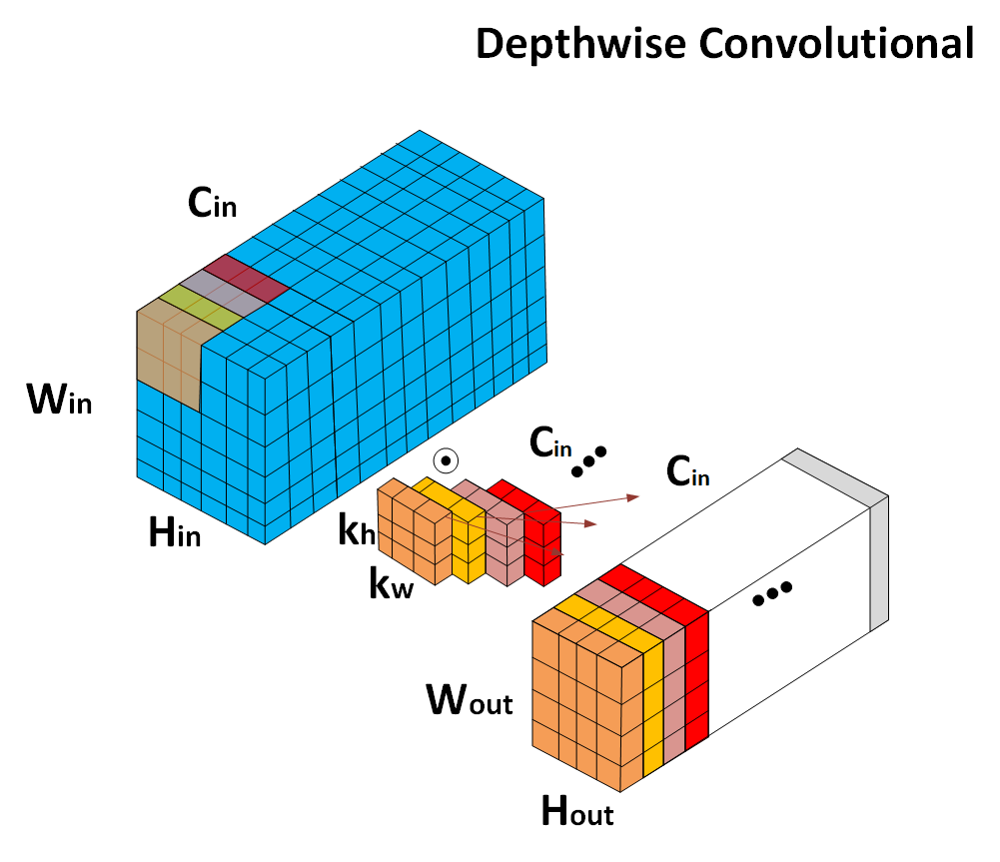
    </div>
<!-- ![image.png](attachment:image.png)     -->

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    
<li> <b>Deepwise-Separable Convolution</b> (for instance, 1-stage $C \cdot 3\times 3\times 1$; 
                                                    2-stage $C \cdot 1\times 1\times 1$).  
        <ul> Combination of sequential rectangular convolution and point-wise convolution for reducing number of parameters in comparison with Spatially Separable Convolution </ul>
    <div>
    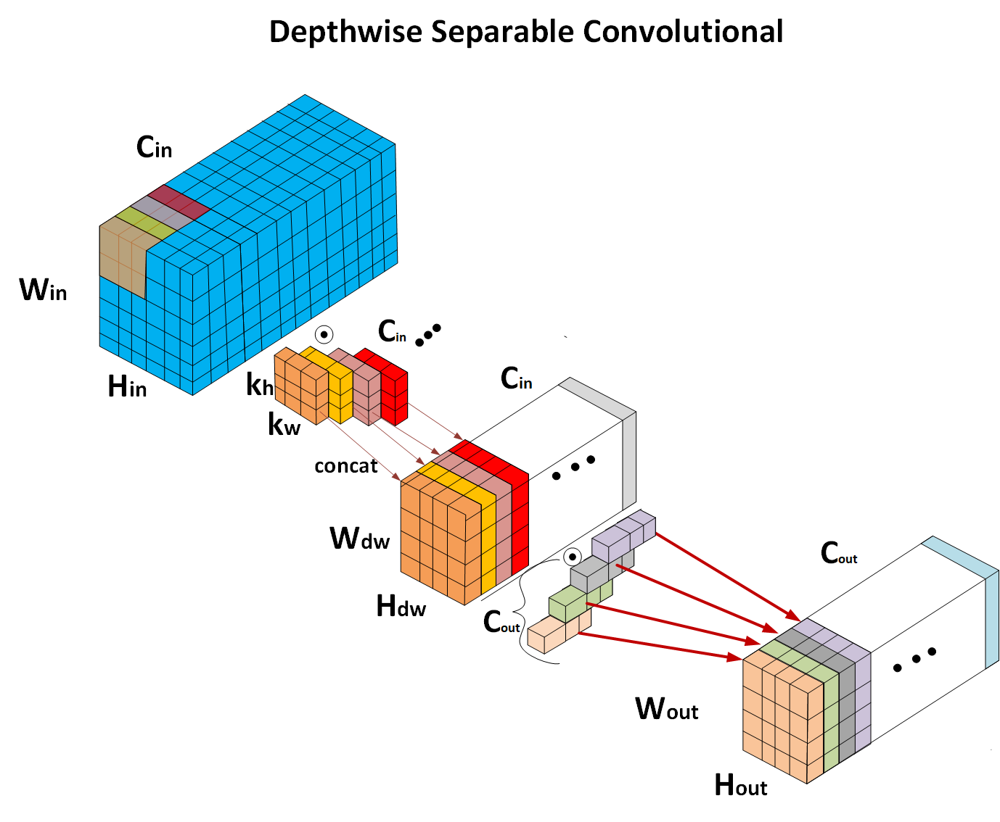
    </div>
 
<!-- 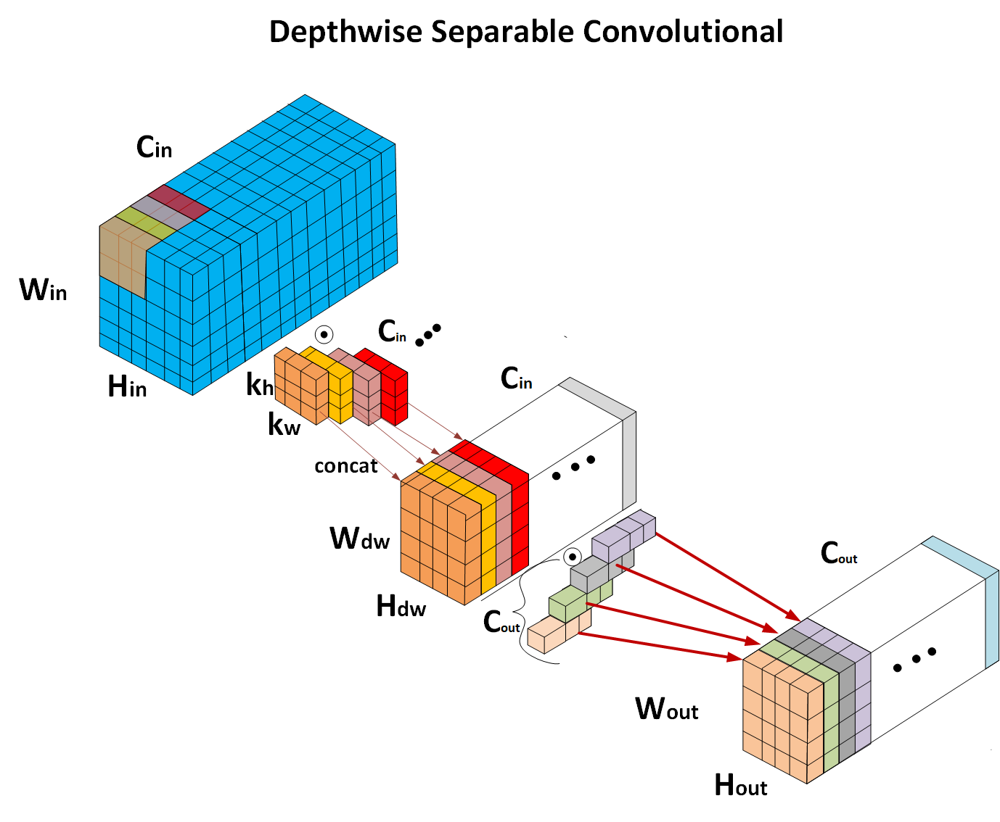     -->

![](https://miro.medium.com/max/600/1*OrIzzK51dQQGjXMiUD3gxg.gif)

<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>
Some explanation of DeepWise Separable Convolution.<br>
It is the one of the most interesting ways to reduce number of parameters in comparison with traditional ones (square, rectangular end e.t.c.).
<br> For traditional convolution the number of parameters is
<span style='font-size:x-large'>    
    $$ P_{layer} =C_{out} \times C_{in}  \times k_w \times k_h + C_{out} = C_{out}\times P_{kernel}, $$
    </span>
    
where:<ul>
<li> $P_{layer}$ is the number of parameters in the layer.
<li> $ P_{kernel} = C_{in} \times k_w \times k_h + 1$ is the number of parameters for kernel.
<li> $C_{out}$ is the number output channels.   
<li> $C_{in}$ is the number input channels.
<li> $k_w$ and $k_h$ is the kernel dimension.
</ul> 
    <br>     
For Deep-wise separable convolution the number of parameters is 
<span style='font-size:x-large'>    
$$ P_{layer} = (C_{in} \times k_w \times k_h + C_{in}) + C_{out} \times 1 \times 1 \times C_{in} + C_{out}= \\= 
C_{in}\times P_{kernel_{DW}} + C_{out}\times P_{kernel_{point}}
, $$
    </span>    
where:
<li> $P_{layer}$ is the number of parameters in the layer.
    
<li> $P_{kernel_{DW}} = \times k_w \times K_h + 1$ is the number of parameters for each Deepwise kernel (input kernel).
    
<li> $P_{kernel_{point}} = 1 \times 1 \times C_{in} + 1$ is the number of parameters for the pointwise kernel. 

<li> $C_{out}$ is the number output channels. 
    
<li> $C_{in}$ is the number input channels.
    
<li> $k_w$ and $k_h$ is the kernel dimension.  
    
</ul> <br>



<font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: justify; padding:35px'>

Thus for common case - kernel $3\times3$ with 16 input channels and 32 output channels we have:<br>
$$ 
\frac{  P_{layer_{TR}}  }
      { P_{layer_{DS}}  }=
      $$
$$      = 
      \frac{ C_{out} \times P_{kernel} }
        {C_{in}\times P_{kernel_{DW}} + C_{out}\times P_{kernel_{point}}}\sim 
\frac{32\times(16\times 3\times 3+1) }{16\times(3\times 3+1)+32\times 17}=\frac{4640}{704}=6.5
$$      



    
    
    
<div>
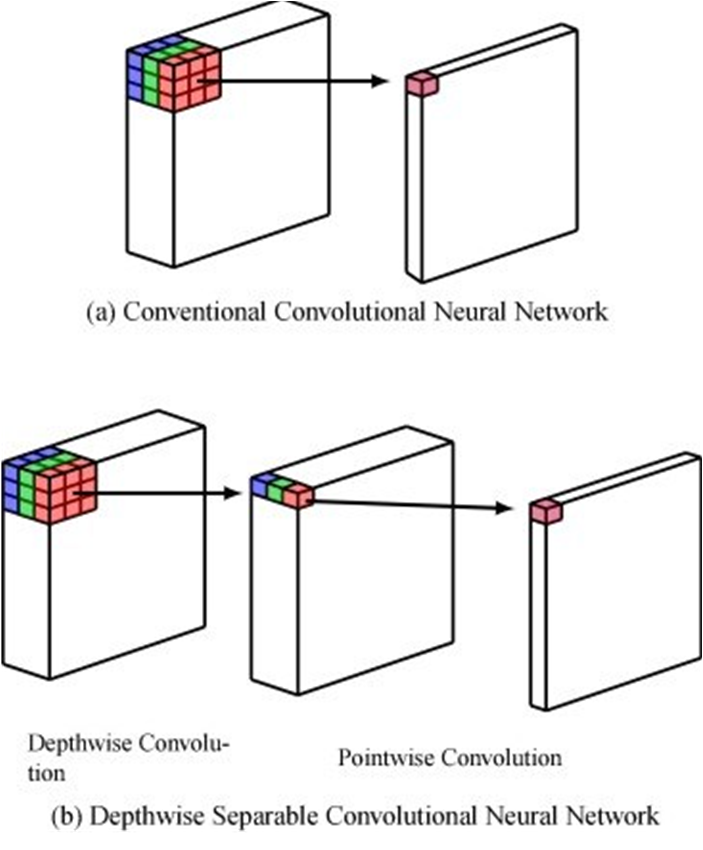
</div>
    
<!-- 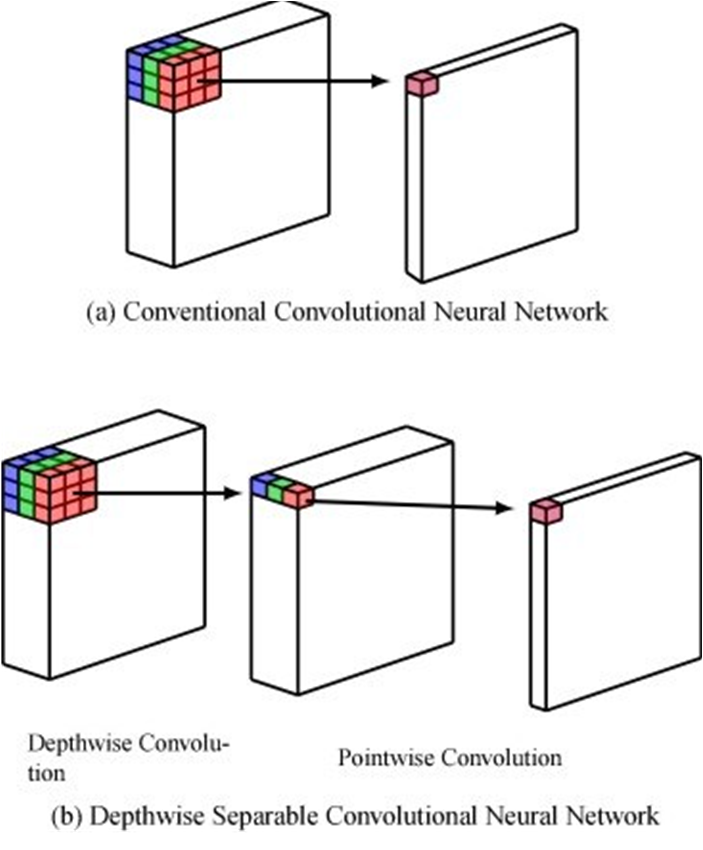 -->


    

 <font size=4.5pt  face = 'georgia' style='Line-height :2'><div style='text-align: left; padding:35px'>
    <em>Noet</em> <ul>
 <li>   A depthwise convolution may also have a channel multiplier. If the channel multiplier is 2, then for each input channel it creates 2 output channels (and learns 2 different sets of weights).
<li>  benefit of splitting the regular convolution operation into two steps is that now we can apply a ReLU twice instead of just once.
    <!-- https://machinethink.net/blog/googles-mobile-net-architecture-on-iphone/ 
https://machinethink.net/blog/mobile-architectures/-->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>DenseNet, (2017)  </b><br>
    The expansion of the ReNet idea can be similar to moving gradient (and feature extraction) through different paths. Thus it could be build a several paths for one layer.<ul> In this case the low-level information can be shared between layers of the each block.<br>
    It also need here to replace summation to concatenation.
    </ul>
$$\mathbf{x} \to \left[
\mathbf{x},
f_1(\mathbf{x}),
f_2([\mathbf{x}, f_1(\mathbf{x})]), f_3([\mathbf{x}, f_1(\mathbf{x}), f_2([\mathbf{x}, f_1(\mathbf{x})])]), \ldots\right].$$
   <ul> In other words "concatenating feature-maps learned by different layers increases variation in the input of subsequent layers and improves efficiency." - channel-wise concatenation
    <li> Due to concatenation it no need to have the same channel size in the each skip connection.
    <li> concatenation instead of summation allow to more optimal reuse information.
    </ul>
    <li> DenseNet join the ideas of ResNet (2015), HighWayNet(2015) and fractalNet (2017).
      <ul>
  <li> The idea is to ensuring maximum information (and gradient) flow.<br>      
Within this instead of drawing representational power from extremely deep or wide architectures, DenseNets exploit the potential of the network through feature reuse.
      <ul> Every layer has access to its preceding feature maps, and therefore, to the collective knowledge.</ul>
   <li> By the DenseNet trick the whole number of parameters is smaller then for other method due to the lack of learn redundant feature maps.
     <ul>Some variations of ResNets have proven that many layers are barely contributing and can be dropped. Instead, DenseNets layers are very narrow and just add a small set of new feature-maps.</ul>
  <li> Furthermore, each layer has direct access to the gradients from the block input and thus learn easier.     
    </ul>    
    <li> For variating the whole model size we need to use additional transition layers.
    <ul> In trans layers down-sample the image dimensions with average pooling.<br>
       Transition Layers need to keep the dimensionality under control when composing the network by adding transition layers that shrink the number of channels again.<br>
      Transition Layers applying  down sampling using batch normalization, a 1x1 convolution and a 2x2 pooling layers.
    </ul>
    <li> The number of feature maps of the total architecture is the growth rate -additional densnet parameter.
    <li> <b>The growth rate (k)</b> controls the amount of information to be added by each layer.
    <li> Traditional architecture is DenseNet-121, however it was also proposed DenseNet-169, -201, -264, and some small modification of transition layers DenseNet-B, DenseNet-BC (-C).
        <ul> The B, BC variants have some compression factor in transition layer  $0<\theta\leq1$ which determine number of feature map after transition (0.5 for -C).</ul>
<!-- 
https://theaisummer.com/cnn-architectures/
https://www.jeremyjordan.me/convnet-architectures/
https://github.com/Dyakonov/DL
http://d2l.ai/chapter_convolutional-modern/densenet.html 
https://arxiv.org/abs/1608.06993
https://habr.com/ru/post/498168/
https://youtu.be/-W6y8xnd--U
https://github.com/Machine-Learning-Tokyo/DL-workshop-series/blob/master/Part%20I%20-%20Convolution%20Operations/ConvNets.ipynb
https://towardsdatascience.com/review-highway-networks-gating-function-to-highway-image-classification-5a33833797b5
https://arxiv.org/abs/1505.00387
https://arxiv.org/pdf/1605.07648.pdf
https://towardsdatascience.com/understanding-and-visualizing-densenets-7f688092391a
http://www.pabloruizruiz10.com/resources/CNNs/DenseNets.pdf
https://towardsdatascience.com/review-densenet-image-classification-b6631a8ef803
-->

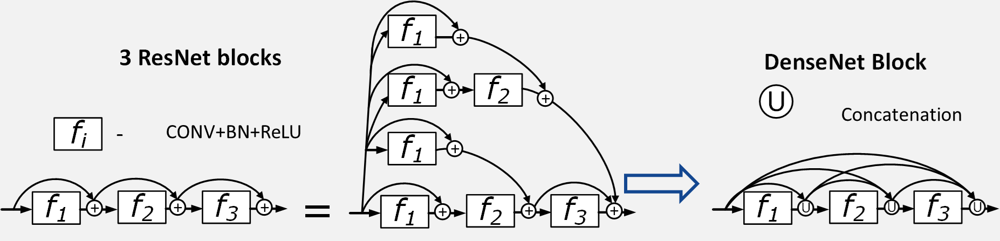

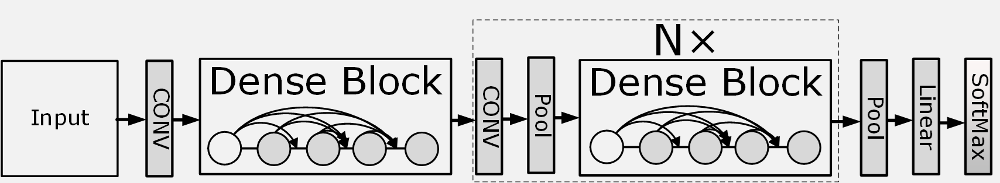

> 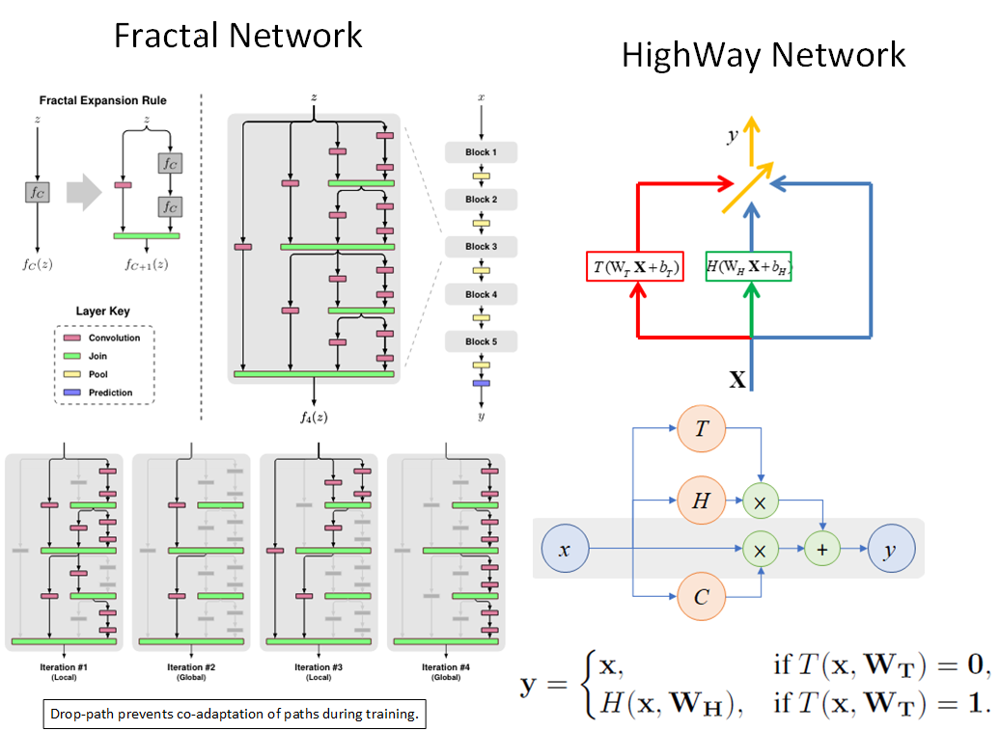
<!-- 
https://towardsdatascience.com/review-highway-networks-gating-function-to-highway-image-classification-5a33833797b5
http://people.cs.uchicago.edu/~larsson/fractalnet/ -->

<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>BiT (Big Transform Architecture), </b>(2019).<br>
    The one of the modern modification of ResNet architecture is the Big Transform Architecture.<br>
    The model is based on the standard ResNet (50, 101 and 152) with increase depth and width (in 1,3 and 4 times) it is also 
    replaced BatchNorm (BN) with GroupNorm and Weight Standardization
    <br> The model was pre-trained on a very large generic dataset.
    <br>
    It was proposed three versions of BiT:<ul>
   <li> BiT-L (Large size) : pretrained upon the dataset JFT-300M (contains 10 to 1 billion image datasets).
   <li> BiT-M (Medium size):  pretrained upon the dataset Imagenet-21K (contains 14 million image datasets)
   <li> BiT-S (Small size): trained upon the dataset ILSVRC-2012 (1.3 million image datasets)
    </ul>
    It was also proposed  BiT-HyperRule for fine-tuning, where all hyperparameters are fixed except:<ul>
    <li>training schedule length, 
    <li>resolution, 
        <ul> if image size are less than 96 X 96 then we will resize and crop images to 160 X 160 and 128 X 128 consecutively otherwise , if more than 96 X 96 then we will resize and crop images to 448 X 448 and 384 X 384 </ul>
    <li> use MixUp regularization f the size of the dataset is more than 20K.
    <li>Use batch size of 512
    </ul>
    <em>Note</em><ul>
  The reasons to replace BN with GroupNorm and Weights Standardization:<ul>
    <li>  when training large models with small per-device batches, BN performs poorly or incurs inter-device synchronization
cost. 
    <li> Second, due to the requirement to update running statistics, BN is detrimental for transfer. 
    <li> It was shown that GN, when combined with WS, allow to improve performance on small-batch training for ImageNet and COCO. ALso they  useful for training with large batch sizes, and has a significant impact on transfer learning.
    </ul>
<!--     https://arxiv.org/pdf/1912.11370.pdf
    https://paperswithcode.com/paper/large-scale-learning-of-general-visual
    https://ai.googleblog.com/2020/05/open-sourcing-bit-exploring-large-scale.html
    https://medium.com/analytics-vidhya/enhance-learning-by-transfering-resnet-architecture-into-big-transform-architecture-44603f537fcf
https://github.com/KushajveerSingh/Deep-Learning-Notebooks
https://tfhub.dev/google/collections/bit/1
 -->

## Low Performance Networks 

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
<b>SqueezeNet, </b>(2016).<br>
SqueezeNet the first attempt to build CNN architectures that can easily be deployed in mobile applications.<ul> 
 The idea: -efficient building blocks, in order to reduce the number of parameters.   
    </ul> 
    <li> The main block is the fireblock: <ol>
    <li> squeeze channels with three $1\times 1$ convolutions.
    <li> expand the output with a several $3\times 3$ and   $1\times 1$  convolutions in parallel.
</ol>
    <li>At the very end is a convolution layer that performs the classification, followed by global average pooling. ( the classification layer both has ReLU and softmax applied to it.)
        <ul>  Note, There are no fully-connected layers.</ul>  
 <li>   SqueezeNet is the most fast and simple architecture, but has a relatively small performance.     
<!-- https://arxiv.org/abs/1602.07360
github.com/forresti/SqueezeNet
https://machinethink.net/blog/mobile-architectures/
https://developpaper.com/brief-introduction-of-squeezenet-squeezenext-lightweight-network/
 -->


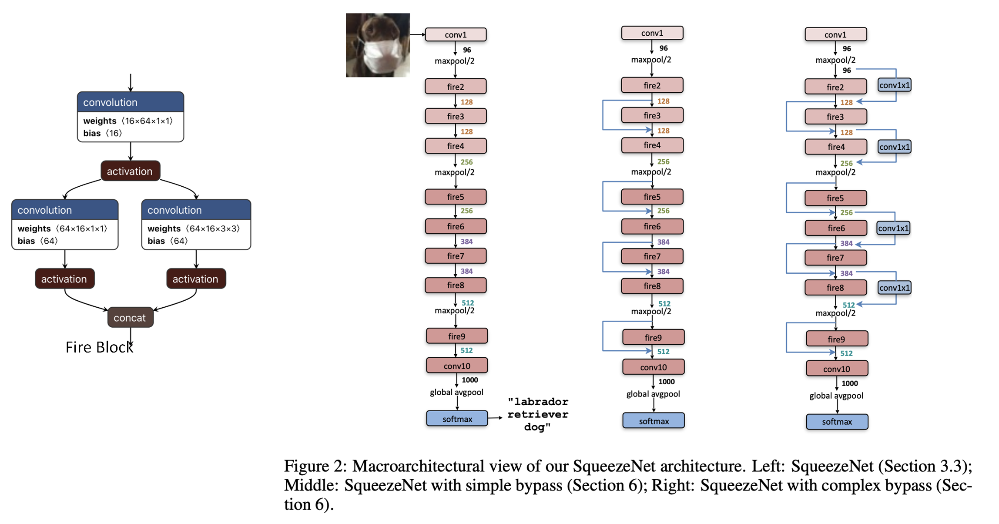

<!-- https://machinethink.net/blog/mobile-architectures/ -->


 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
    The similar to SqueezeNet idea lay in<br> <b>SqueezNeXt</b> network (2018)<br>
The SqueezeNext block consists in<ul>    
<li> sequentially squeezing number of channels with two  bottleneck layers (to C/2, and C/4).
<ul> It is proposed that two stages allow to make more non-linearities - i.e. more accuracy squeezing </ul>
<li> Spatial-separable convolution 3×1 and 1×3
<ul> The order of these two convolutions alternates. If this block has 3×1 followed by 1×3, the next block does 1×3 first and 3×1 second, and so on.</ul>
<li> The back expansion of channels.
<li> residual connection.
<li> SqueezeNext incorporates a final bottleneck layer to reduce the input channel size to the last fully connected layer.
 <li> The depth and number of layers here are hyperparameters.   
<!--     https://machinethink.net/blog/mobile-architectures/ -->
<!--     https://arxiv.org/abs/1803.10615 -->
<!--     https://github.com/amirgholami/SqueezeNext -->
<!--     https://sh-tsang.medium.com/reading-squeezenext-hardware-aware-neural-network-design-image-classification-3fc8d1d3f76 
-->

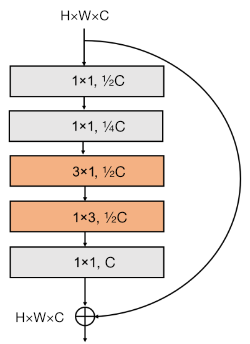
SqueezeNext

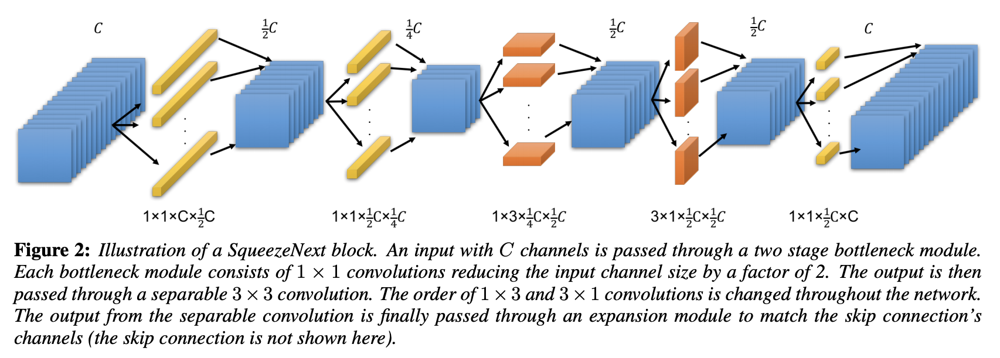

<!-- https://paperswithcode.com/method/squeezenext# -->

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>MobileNet V1</b>(2017)
MobileNets the first success attempt to build CNN architectures that can easily be deployed in mobile applications.<br>
    <br>
   <u> The main idea under Mobile Net is to replace conventional convolution with deepwise separable convolution.</u>  <br><br>
MobileNet has two parameters <ul>
    <li> Width multiplier (depth multiplier, $\alpha$) - how many 
        channels are used by the model’s convolution layers.   
    <li> Resolution multiplier ($\rho$) - how to reduce the dimension of the channels in the internal and input layers.
        <ul>  In practice we implicitly set $\rho$ by setting the input resolution.</ul>   
    </ul>
MobileNet v1 consists of 13 building blocks. <ul>
    <li> Each MobileNet V1 block is the DeepWise Separable Convolution with batchnorm.
    <li> MobileNet blocks does not use max pooling <br>
    <li> Some of the depthwise layers have stride 2 instead of max pooling.
    <li>  At the end MobileNet V1 use a global average pooling layer followed by a fully-connected layer or a 1×1 convolution for doing the classification.    
    </ul>    
 All MobileNet blocks use ReLU6 is used as the activation function instead of plain ReLU.<ul>
    <li> ReLU6 is more robust than regular ReLU when using low-precision computation. </ul>

    
    
<!--     https://machinethink.net/blog/mobile-architectures/
https://habr.com/ru/post/352804/
https://arxiv.org/abs/1704.04861
https://arxiv.org/abs/1801.04381
https://github.com/tensorflow/models/tree/master/research/slim/nets/mobilenet
https://github.com/tensorflow/models/blob/master/research/slim/nets/mobilenet_v1.md
https://machinethink.net/blog/mobilenet-v2/
https://github.com/arthurdouillard/keras-mobilenet
 -->

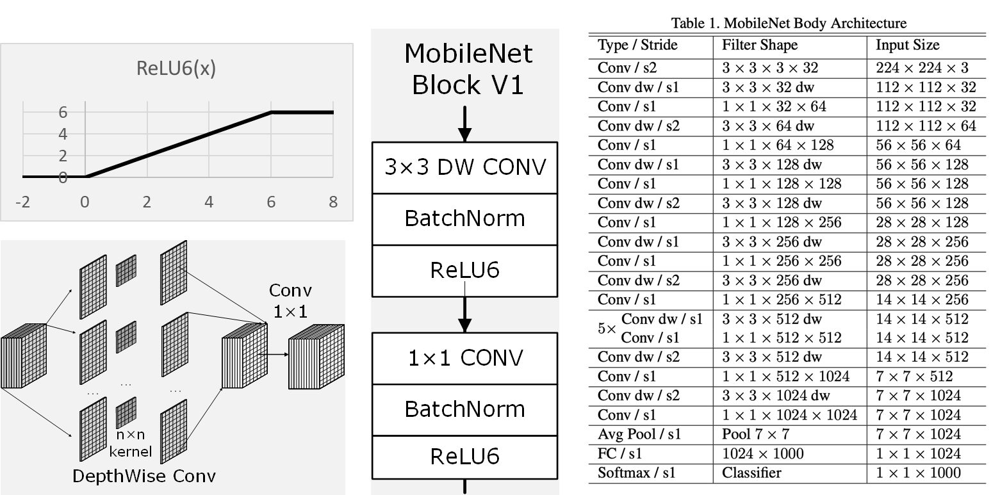


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
<b>MobileNet V2</b>(2018)<ul>
     <li> MobileNet v2 architecture consists of 17 building blocks.
    <li>  At the end MobileNet V2 use a regular 1×1 convolution, a global average pooling layer, and a classification layer.</ul>
MobileNet V2 use blocks - bottleneck convolution block with expansion layer:  <ul> 
    <li>1 stage - expansion (t times - expansion factor $\in [5,10], 6$ by default) - creating the manifold of interest ($D_f \times D_f\times C_{in} \to  D_f \times D_f \times (t\times C_{in})$)
    <li>2 stage - deep wise layer obtaining $(D_f/s) \times (D_f/s) \times (t\times C_{in})$, where $s$ is the stride.
    <li>3 stage - project layer (or  bottleneck layer) - decrease the expansed dimension to the $(D_f/s) * (D_f/s) * C_{out} $, where $C_{out}$ is the number of channels on the block output. The idea (or hypothesis) of this layer is to reduce dimension without reducing of information (use nested  manifold).  <ul> The trick that makes this all work, of course, is that the expansions and projections are done using convolutional layers with learnable parameters, and so the model is able to learn how to best compress/decompress the data at each stage in the network.</ul>
    <li> Residual connection to help with the flow of gradients through the network. (used when the number of in-channels and out-channels are the same, and size of channels the same). <ul>
        The authors call this an <b> inverted residual</b> because it goes between the bottleneck layers, which have only a small number of channels. 
    </ul>
<li> As usual, each layer has batch normalization and the activation function is ReLU6.
<li> The output of the projection layer does not have an activation function.    
    <ul> The authors call this an <b>linear bottlenecks</b>.<ul>
        Since this layer produces low-dimensional data, the authors of the paper found that using a non-linearity after this layer can destroyed useful information.
    </ul>
    <ul>
        MobileNet V1 use only stage 1 and 2 of MobileNet V2 block.<br>
   Thus MobileNet V2  have much fewer parameters than V1 and a slightly improved score on the classification benchmark.
    </ul>
    
    
<!--     https://machinethink.net/blog/mobile-architectures/
https://habr.com/ru/post/352804/
https://arxiv.org/abs/1704.04861
https://arxiv.org/abs/1801.04381
https://github.com/tensorflow/models/tree/master/research/slim/nets/mobilenet
https://github.com/tensorflow/models/blob/master/research/slim/nets/mobilenet_v1.md
https://machinethink.net/blog/mobilenet-v2/
https://github.com/arthurdouillard/keras-mobilenet
 -->

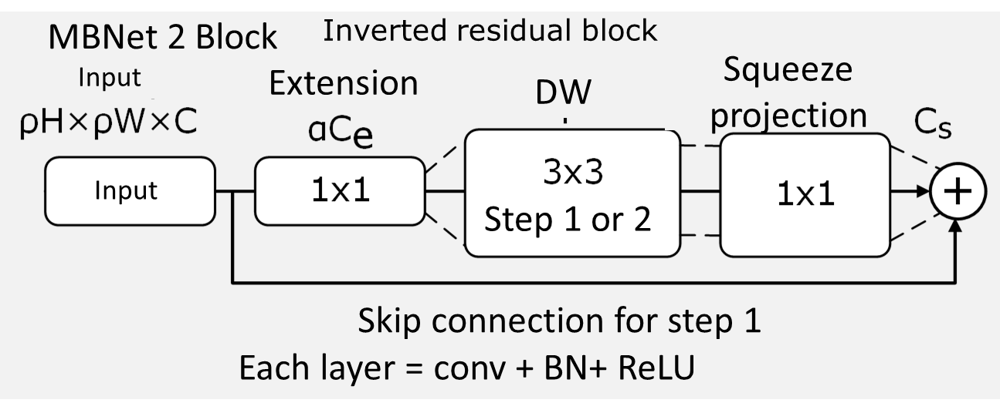

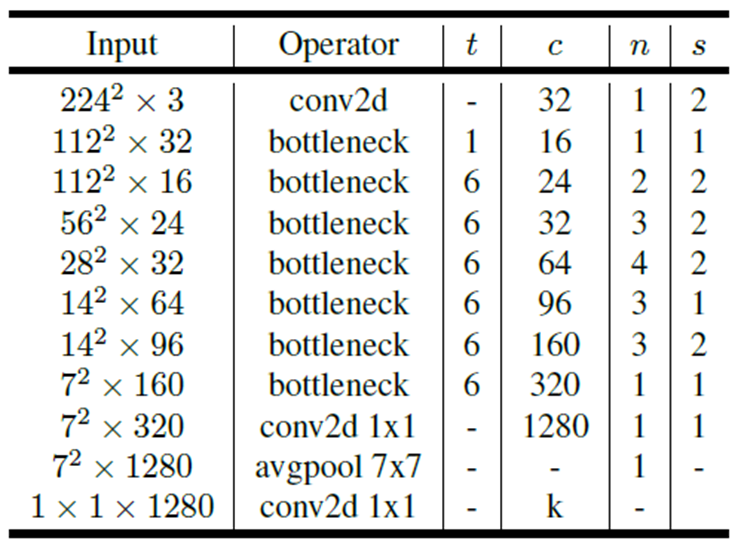

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    
t - expansion factor; c - number of channels; n - number of same blocks; s -s step (stride) 

## Attention based networks

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
 Generic idea of attention in the image processing is to highlight features locations.<br>
    The illustration shows through channel self - attention. This operation allows making re-grouping of the pixels between channels. <br>
    By this operation allows avoiding some non-regular features of the input data by resting only one stable to different permutations. 
    
    

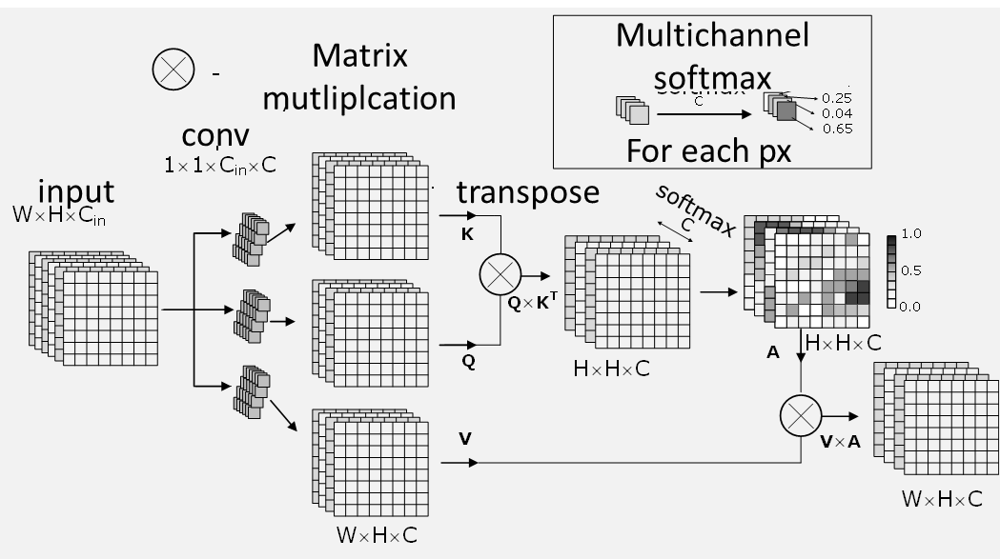

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    It could be different variants of attention, which could be joint togeather.

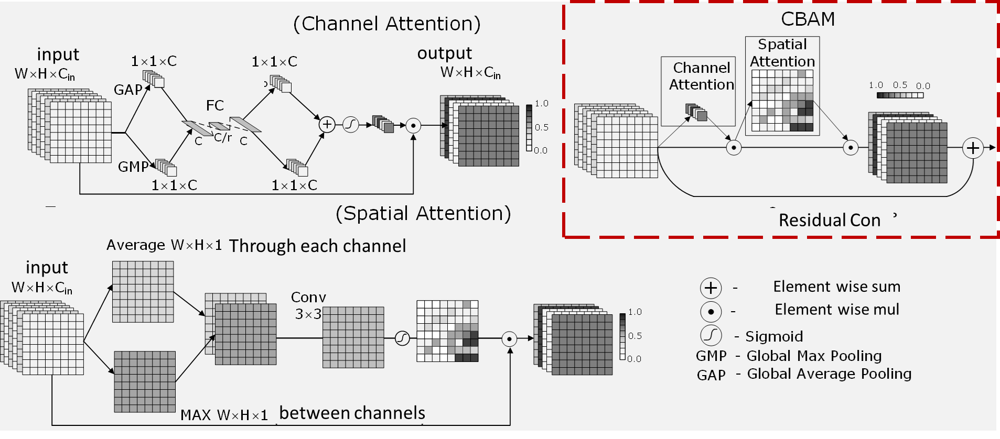

CBAM - convolution block of attention modules

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>Squeeze-and-Excitation Networks (2019)</b><br>
 The main idea under this block is recalibrate the channels to gain the information that they contain - to increase  sensitivity to informative features. <ul>  map the channel dependency along with access to global information to performance gains.</ul>
    Each SE block consists in <ul>
    <li> a feature transformation (convolution) input X to get features U. 
    <li> squeeze operation to get a single value for each channel of output U. (Global Average Pooling, $F_{\rm sq}$)
    <ul> $F_{\rm sq}$ give output $X$ with dimensions $1\times 1\times C$, where C is the number of channels.</ul>
    <li> The excitation operation on the output of the squeeze operation to get per-channel weights ($F_{\rm ex}$).
    <ul> $F_{\rm ex}$ using two full connected layers $F_{\rm ex} = \sigma(W_2ReLU(W_1X)) = s$, where $\sigma$ is the sigmoid; $s$ is the vector of coefficients each in the range from 0 to 1.</ul>
    <li> Re-scaling weights with identity connected feature map ($F_{\rm scale}$). 
    <ul> $F_{\rm scale} = s\odot U$ - scaling with excitation operation coefficients.</ul>
    </ul>
<!--     
https://arxiv.org/pdf/1709.01507
    https://github.com/Dyakonov/DL
    https://amaarora.github.io/2020/07/24/SeNet.html 
https://towardsdatascience.com/review-senet-squeeze-and-excitation-network-winner-of-ilsvrc-2017-image-classification-a887b98b2883
https://blog.paperspace.com/channel-attention-squeeze-and-excitation-networks/
-->

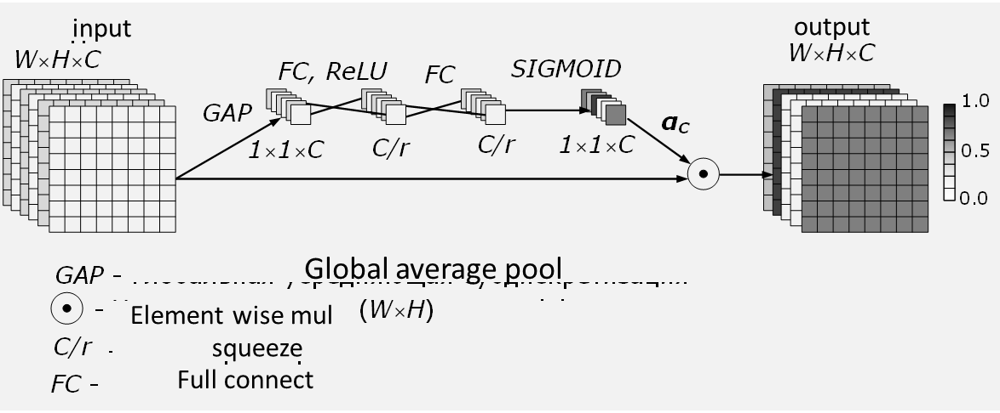

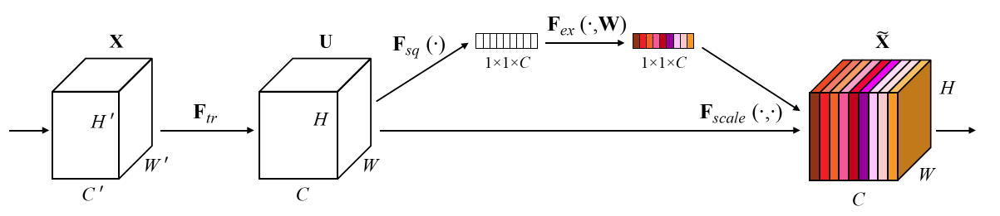

<!-- https://towardsdatascience.com/review-senet-squeeze-and-excitation-network-winner-of-ilsvrc-2017-image-classification-a887b98b2883 -->

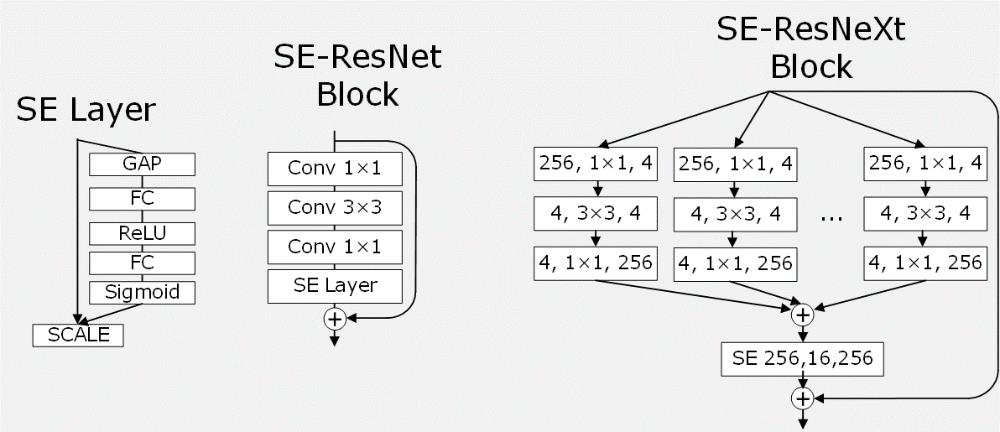

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
   In the original idea re-scaling in earlier layers allows to:<ul>
    <li> excites informative features (in a class-agnostic manner as authors stay); 
    <li> strengthening the shared low-level representations.</ul>
In later layers, the SE blocks become increasingly specialised, and respond to different inputs in a highly class-specific manner.
    <li>As a consequence, the benefits of the feature recalibration performed by SE blocks can be accumulated through the network.
      <li> SE Block can be considered as analogue of self-attention.
          <ul> However, here sigmoid applied instead of soft-max to have analogue of multi-class weighting (instead of only one channel attention in soft-max).</ul>
     <li> It cold be distinguished  SE Inception block (described above) and Se-ResBlock with additional residual connection. 
    <li> SE blocks are also computationally lightweight and impose only a slight increase in model complexity and computational burden.   
<!--     
https://arxiv.org/pdf/1709.01507
    https://github.com/Dyakonov/DL
    https://amaarora.github.io/2020/07/24/SeNet.html 
https://towardsdatascience.com/review-senet-squeeze-and-excitation-network-winner-of-ilsvrc-2017-image-classification-a887b98b2883
https://blog.paperspace.com/channel-attention-squeeze-and-excitation-networks/
-->

### Neural Architecture Search - MNas, MobileNetV3, EfficientNet

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    Neural Architecture Search (NAS) – allows to find optimal architecture for you specific task in the determined point of view.<ul>
    For instance for specific task.</ul>
    The determined point of view - i.e. measure can includes such characterisics as : <ul>
    <li> accuracy on specific dataset;
    <li> time of inference for specific device;
    <li> size of network;
    <li> trade-off for specific device for some specific task;   
        and many other. </ul>
  <br><br>
    The main drawback of NAS is restriction of possebilities by experience of researcher.<br>
    On the practice we use NAS for wide turning.

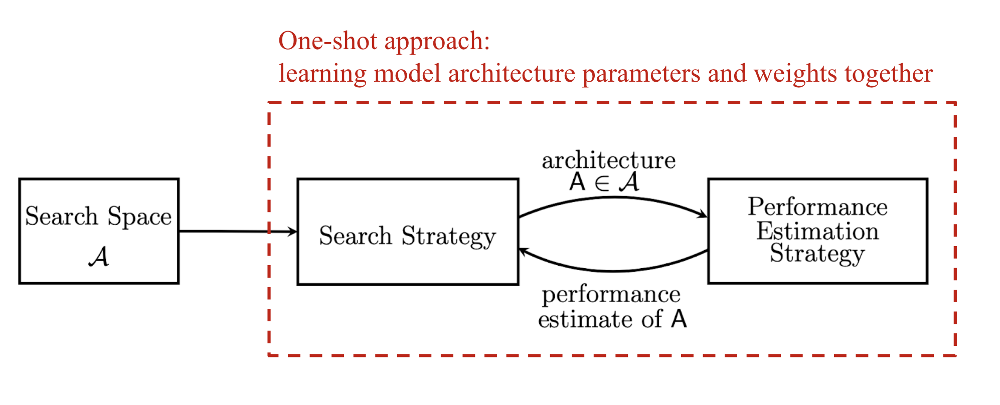

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:5px; margin-top:-5px; margin-bottom:-5px'>
 NAS includes three components:<ul>
    <li> Search Space: for instance, <ul>
        <li> prepared blocks, but we want to finde sequence;
        <li> base of backbone is set, and we have several types of layer and  we want to finde sequence.
        <li> base of backbone is set, and we want to determine where to use SE block or DepthWise Conv. </ul>
    <li> Search Strategy - how to select candidates:<ul>
        <li> Reinforcement search;
        <li> RNN through candidates as sequence;
        <li> Genetic algorithms; </ul>
    <li> Performance Estimation Strategy or Candidate Evaluation Method – for instance:<ul>
        <li> accuracy or computational complexity; 
        <li> how to select between candidates: <ul>
            <li> train all possible variants but for small number of epochs;
            <li> train all possible variants with reduced number of parameters;
            <li> intilize new models with weights of previous variants;
                

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'><ul>
    <b>MFBNet (2018)</b><br>
    The other idea of NAS search with fixing the overall structure of network and search for the best block architecture.
    As base block the MobileNet V2 block was taken.<br>
    The block consists in<ul>
       <li> 1×1 convolution for expansion + BN+ReLU
        <li>depthwise convolution + NB + ReLU
        <li>1×1 bottleneck layer + BN (with no activation)
        <li>residual connection (if output has same size as input)
    </ul>
    In the search was the following assumptions:<ul>
        <li> The first 1×1 conv layer can expand the number of channels by a factor 1, 3, or 6. 
        <li> The depthwise convolution can be 3×3 or 5×5. 
        <li> Both 1×1 layers can use group convolution. 
        <li> In total, there are 9 possible configurations of this building block that the search can choose between.
        <li> The overall structure of the network is fixed: the number of layers, the number of filters per layer, which layers do stride 2, etc.
        <li> Some of the blocks can be only identity one.    
        <li> The network starts with a search of configuration of single convolution layer, then there are several stages of four building blocks each, followed by a final 1×1 convolution.
        <li> Finally, always the global average pooling and a classifier layer
        <li> All layers, except for the global pooling and the classifier, are found by searching.   
    </ul>

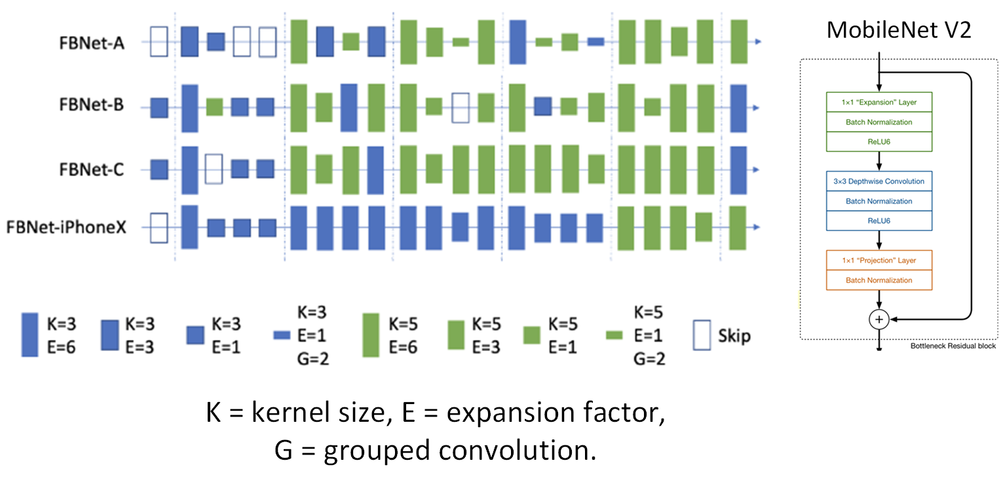
<!-- https://arxiv.org/abs/1812.03443 -->
<!-- https://machinethink.net/blog/mobile-architectures/ -->

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>
    <b>MobileNet V3 (2019)</b><br>
    The MobileNet V3  architecture was partially found through automated network architecture search (NAS, block-wise search) and from NetAdapt, Which is used to fine-tune the number of convolution kernels of each layer after the network layer is determined for each module, so it is called Layer-wise Search.
  <br>   The algorithm was additionally simplifies a pre-trained model until it reaches a given latency, while keeping accuracy high. <br>
        Analyzed blocks was similar to one in ShuffleNet(V1 and V2), MNasNet, CondenseNet, EffNet and other. 
  The main change in the architecture in comparison with MobileNetV2: <ul>
    <li>expensive layers were redesigned
    <li>use of Hard-Swish instead of ReLU6 in deep layers $\text{h\_swish}(x) = x * \text{ReLU}6(x + 3) / 6$;
        <ul> Not all of the model uses h-swish: the first half of the layers use regular ReLU (except after the first conv layer). The MobileNet creators found that h-swish was only beneficial on the deeper layers. </ul>
    <li> Include Squeeze-and-excitation modules (SE) in blocks<ul>
        <li> In this block sigmoid replaced with so-called $\text{hard-$\sigma$} = \text{ReLU}6(x+3)/6$
        <li>The squeeze-and-excitation (SE) modules only reduce the number of channels by a factor 3 or 4.
    </ul>
    <li> It was also optimize the last layers.<ul>
        The main idea is to exceed the number of channels to make classification.  
        In MBN V3 all channels was 1x1 (instead of 7x7 in MBN V2).
        <br> Also there are not applied batch normalization.</ul>
    </ul>
    It was proposed a several architecture variants:<ul>
    <li>    Large: full, described above;
    <li>Small: this has fewer building blocks and smaller numbers of filters
    <li>Large minimalistic: like Large, but doesn’t have SE, h-swish, 5×5 convolutions
    <li>Small minimalistic: likewise for the Small variant
    </ul> 
    All of the MBNet variant allow to use depth-multiplier. 
    <em>Note</em><ul>
    Actually, MobileNet was designed for Android OS and TFLight framework, in some other cases it is can be more optimal to use other architectures, or at least it could be more fast to use original sigmoid and swish ($swish(x)=x\sigma(x)$).
<!--     https://towardsdatascience.com/everything-you-need-to-know-about-mobilenetv3-and-its-comparison-with-previous-versions-a5d5e5a6eeaa -->
<!-- https://openaccess.thecvf.com/content_ICCV_2019/papers/Howard_Searching_for_MobileNetV3_ICCV_2019_paper.pdf -->
<!--     https://arxiv.org/abs/1804.03230 -->    
<!--     https://arxiv.org/abs/1905.02244 -->
<!--     https://sh-tsang.medium.com/overview-my-reviewed-paper-lists-tutorials-946ce59fbf9e
 https://stackoverflow.com/questions/61302811/how-to-reproduce-the-bottleneck-blocks-in-mobilenet-v3-with-keras-api 
https://www.programmersought.com/article/94474022387/
https://www.programmersought.com/article/21534016801/
-->

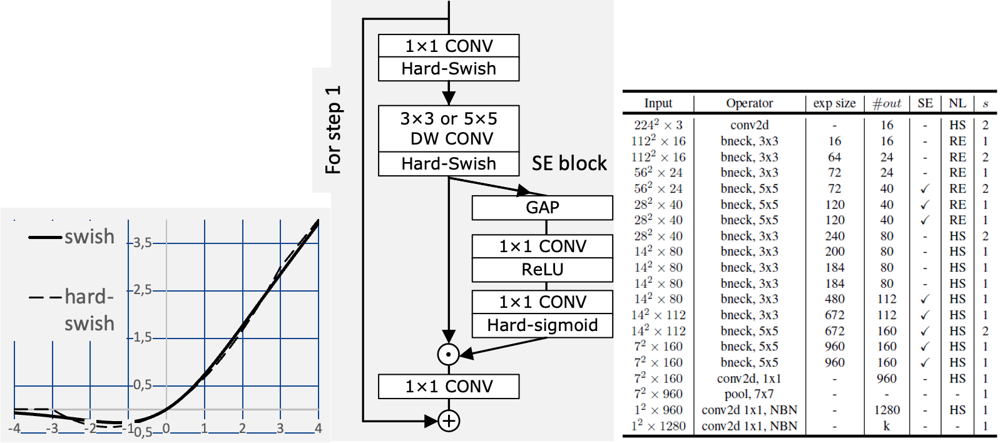

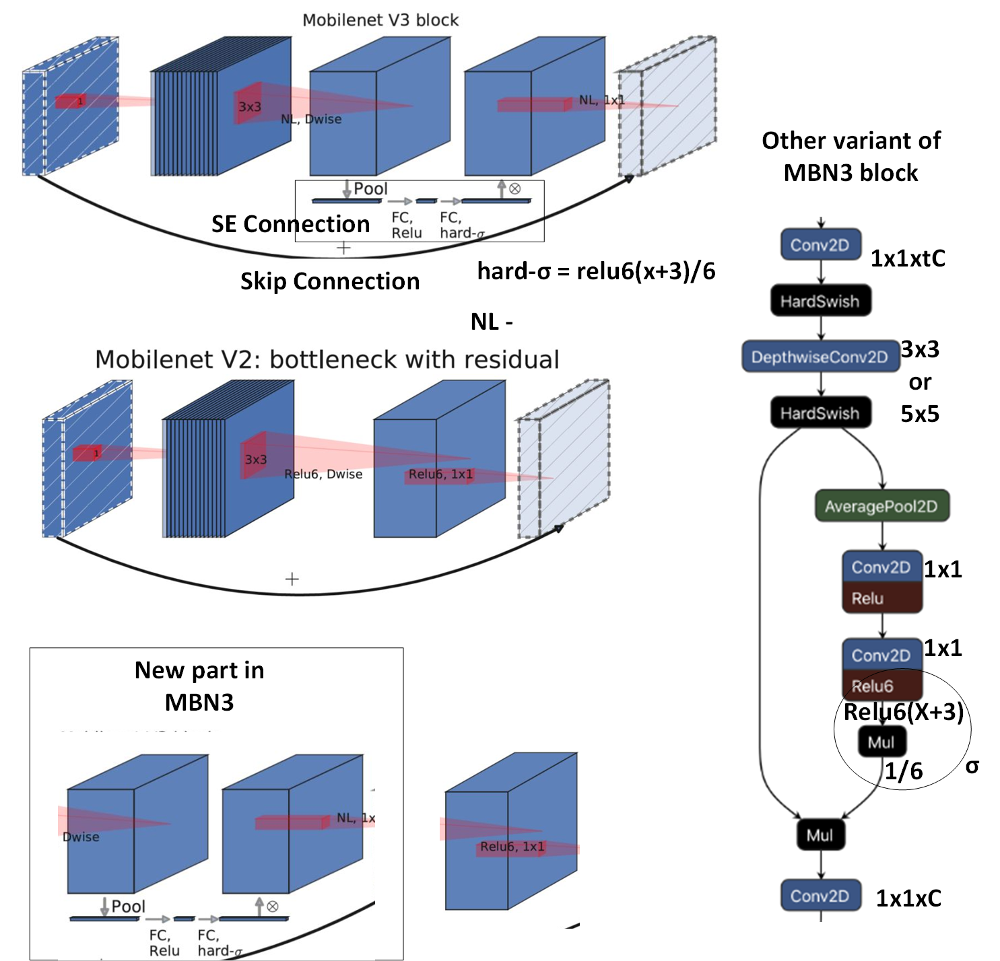

<!-- https://machinethink.net/blog/mobile-architectures/ -->

<!-- https://www.programmersought.com/article/21534016801/ -->

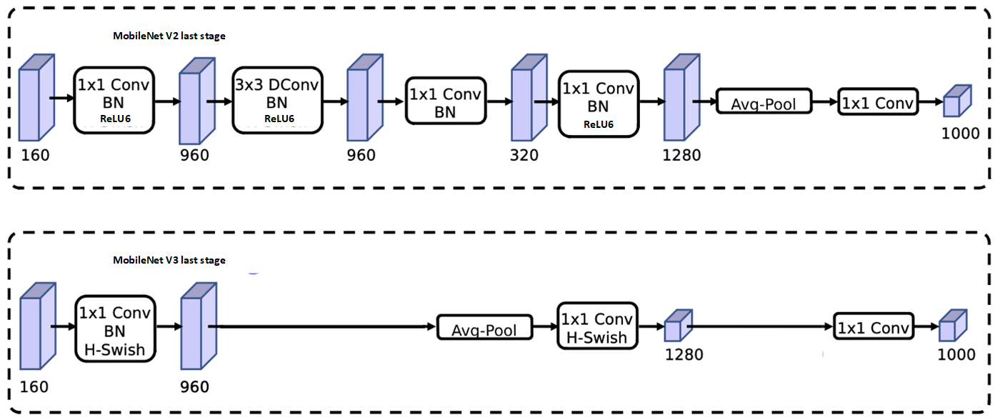

<!-- https://machinethink.net/blog/mobile-architectures/ -->

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
<b>EfficientNet (2019)</b>   
The architecture was obtained using NAS architecture search. Within that it was proposed to use MobileNet V3 (MBN3)-like blocks.
Due to architecture search with MBN3 block three parameters can be scaled up or down:<ul>
    <li><b>Network width</b>,$ C \sim \alpha$: number of <b>filters (channels)</b> per convolution layer. 
    <li><b>Network depth</b>, $L,\sim \beta$: <b>number of layers</b> in each stage of the model.
        <ul> I.E. the number of stages stays the same, but stages can be made deeper by adding more layers to them.</ul>
    <li><b>Input resolution $H\times W,\sim \gamma$</b>: The <b>dimensions</b> of the input image. 
        <ul>common $\mathrm{224\times224}$ , the higher resolution can improve the accuracy, the resolution can be decreased.<br>
        <em>Note</em><ul>Intuitively, if the input image is bigger, then the network needs more layers to increase the receptive field and more channels to capture more fine-grained patterns on the bigger image.</ul></ul>
</ul>

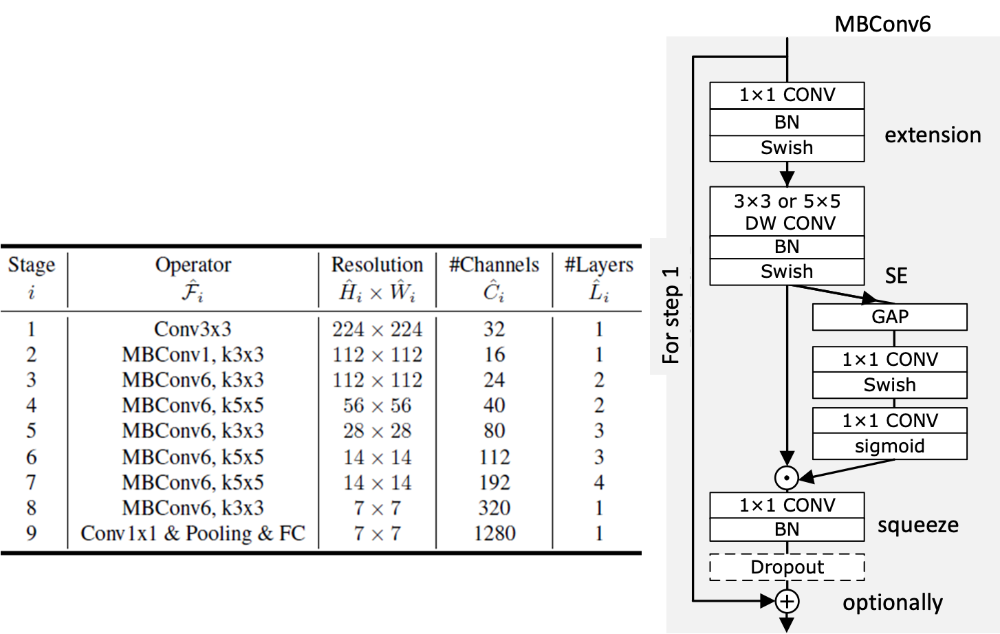


<font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:3px; margin-top:-3px; margin-bottom:-3px'>   
For the parameter search it was proposed to use <b>compound scaling method</b>, that lets scale $\alpha,\beta,\gamma$ together. 
     <ul>The goal is to achieve the maximum possible accuracy while using as few FLOPS as possible.</ul>
    For this it was proposed to use a base-line model $F$ and its parameters of scaling:
    $$\alpha_0^\phi, \beta_0^\phi, \gamma_0^\phi,$$
    where <ul>
    <li> $\alpha_0 = 1.2, \beta_0=1.1, \gamma_0=1.15$,
    <li> $\phi$ is the change parameter, chosen such as the total FLOPS will increase by $2^\phi$(approximately) and 
     $ \alpha\cdot\beta^2\cdot\gamma^2 \approx 2$ .
    <ul> <em>Note</em><ul> the square here is due to doubling network depth will double FLOPS, but doubling width or input resolution will increase FLOPS by four times. </ul> </ul>
    </ul>
<b> EfficientNet-B0 </b> - the first result of the proposed search (baseline network, $\phi = 1$)<br>
    <ul> The EfficientNet-B0 architecture is very similar to MnasNet,uses the same MBConv building blocks with 3×3 and 5×5 depthwise convolutions, squeeze-and-excitation (SE), and swish activation. There is nothing particularly new in this architecture.
        <b>EfficientNet-B1-B7</b> are the modified variants of The EfficientNet-B0 with increased $\phi$.
        <ul> The number of stages and the types of building blocks in $\mathrm{B1-B7}$ stay the same as in $\mathrm{B0}$, but resolution ($\gamma$),  width ($\beta$), and  depth ($\alpha$) all become larger.</ul>
        It was farther proposed also EfficientNet-EdgeTPU S, L and M (3 versions) and Light version - all with smaller number of parameters than for $\mathbf{B0}$. 
        <ul> architecture optimized for TPU uints, designed without swish  and SE blocks, sometimes Deepwise conv replaced with conventional conv.
        </ul> 
        Actually, there are exits a lot of EfficientNet modifications.</ul>
 <em>Note</em> <ul>
    <li> During the search for $\mathrm{B0}$ the optimized parameter was 
        $$ \mathrm{ACC}(m)\cdot\left(\frac{\mathbf{FLOPS}(m)}{T}\right)^w$$ 
    where<ul>
    <li>$\mathrm{ACC}(m)$ and $\mathbf{FLOPS}(m)$ denote the accuracy and FLOPS of model $m$, 
    <li>$T$ is the target FLOPS 
    <li>$w=-0.07$ is a hyperparameter for controlling the trade-off between accuracy and FLOPS.
        </ul>
    <li> The compound search aim is based on the trade off between computational cost (FLOP) and the following assumptions:<ul>
        <li> With more layers (depth) model can capture richer and more complex features, but the models are hard to train (due to the vanishing gradients)
        <li> Wider networks are much easier to train. They tend to be able to capture more fine-grained features but saturate quickly.
        <li> By training with higher resolution images, it can be captures more fine-grained details, but it is require more layers (more receptive field). 
        </ul>
    <li> Actually, the compound search performed into two steps: <ol>
       <li> Fix $\phi = 1$, assume that twice more resources are available, and do a grid search of $\alpha , \beta ,\gamma$. The best acquired values for EfficientNet-B0 are $\alpha = 1.2, \beta = 1.2, \gamma = 1.15$ such as 
    $\alpha\cdot\beta^2\cdot\gamma^2 \approx 2$;
        <li>Fix $\alpha , \beta ,\gamma$ and scale up $\phi$ with respect to the hardware (FLOPs + memory).
    </ol>
    <li> Actually, EfficientNets use NAS to construct a baseline network (B0), then they use “compound scaling” to increase the capacity of the network without increasing the number of parameters greatly.     
     <li> In fact, this idea of Compound Scaling also works on existing MobileNet and ResNet architectures.   
<!--
https://arxiv.org/abs/1905.11946
https://machinethink.net/blog/mobile-architectures/
https://github.com/tensorflow/tpu/tree/master/models/official/efficientnet
https://ai.googleblog.com/2019/08/efficientnet-edgetpu-creating.html
https://github.com/tensorflow/tpu/tree/master/models/official/efficientnet/edgetpu
https://blog.tensorflow.org/2020/03/higher-accuracy-on-vision-models-with-efficientnet-lite.html
https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html
https://www.programmersought.com/article/60016307529/
https://github.com/keras-team/keras-applications/blob/master/keras_applications/efficientnet.py
https://github.com/qubvel/efficientnet
https://theaisummer.com/cnn-architectures/
https://arxiv.org/abs/1904.04971
https://arxiv.org/abs/1911.09665
https://arxiv.org/abs/1911.04252
https://towardsdatascience.com/google-releases-efficientnetv2-a-smaller-faster-and-better-efficientnet-673a77bdd43c
https://amaarora.github.io/2020/08/13/efficientnet.html
     -->

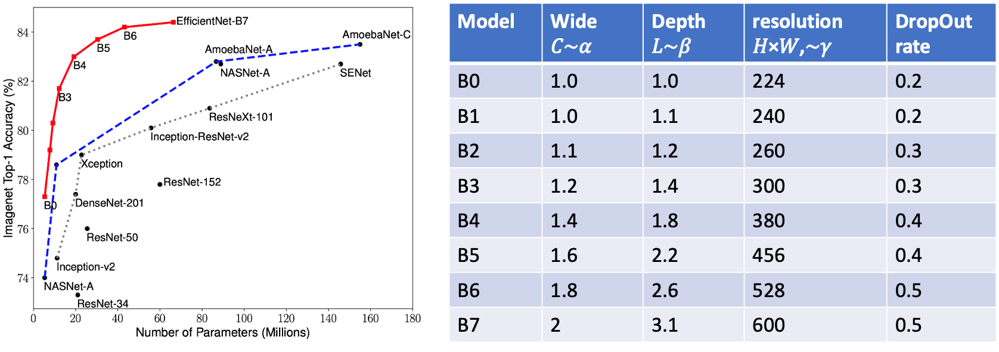

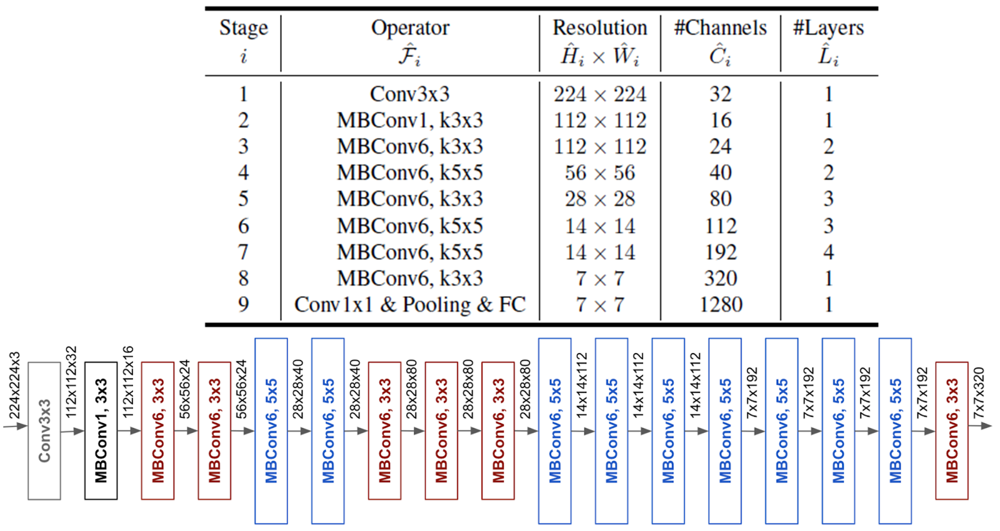

The achitecture for EfficientNet-B0

<!-- https://sh-tsang.medium.com/efficientnet-rethinking-model-scaling-for-convolutional-neural-networks-image-classification-ef67b0f14a4d
-->

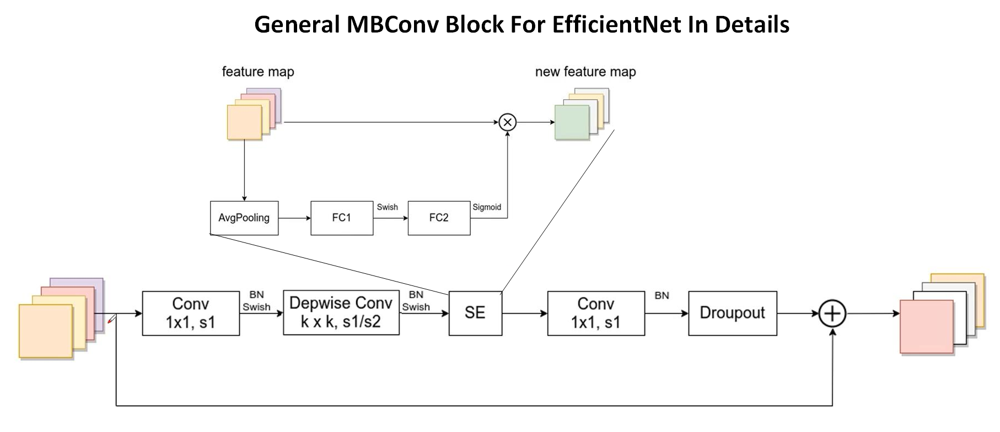

<!-- https://www.programmersought.com/article/81458272976/ -->

 <font size=4.5pt  face = 'georgia' style='Line-height :3'><div style='text-align: justify; padding:35px; margin-top:-35px; margin-bottom:-35px'>
    <b>EfficientNet V2 (2020)</b><br>
    THe authors of EfficientNet V2 discovered that the extensive use of depthwise convolutions could be the training bottleneck.
    <ul>DepthWise convolutions in theory uses fewer parameters and FLOPSs than regular convolutions, but they are not fully utilized the hardware (as CPU as GPU) in some cases.</ul>
    The Authors proposed to use so-called <b>fused convolution. </b>
     <ul>Here In the Fused-MBConv block, 1×1 and 3×3 convolution are fused together, forming a single convolution layer with 3×3 filter.<br>
      To find where to place MBConv and Fused-MBConv layers, the authors use Neural Architecture Search. 
         <ul> The results of NAS show that the replacement of some of the MB Conv layers with the fused ones in early stages offers better performance with smaller models.</ul>
    </ul>
    The other change to EfficientNet V1:<ul>
    <li> uses smaller expansion ratio for MBConv 
        <ul> tend to have less memory access overhead.</ul>
    <li> Prefers to use 3×3 kernel sizes.
        <ul>but more layers are stacked to handle larger receptive fields.</ul>
    <li> EfficientNet V2 completely removes the last stride-1 stage in the original EfficientNet, perhaps due to its large parameter size and memory access overhead.
     <li> Authors used non-uniform scaling strategy to gradually add more layers at later stages.
     <li> Authors also add a scaling rule to restrict maximum image sizes.   
     <li> Using of stochastic depth during the train in architecture search (similar as DropOut but replace the block on skip connection with  some probability()see resnets).
    </ul>
   In addition to NAS and compound search the EfficientNet V2 uses the <b>concept of progressive learning </b> that means that image sizes is increasing progressively during the learning and with increasing the regularization effect.
    <ul>
        The main idea is to use different regularization on the different image size ((with increasing effect to high resolution). The following regularization is applied with intensity inversely proportional to the image size:
        <ul>
            <li> dropout with change of probability; 
            <li> data augmentation with change of magnitude;
            <li> mixup - cross-data augmentation 
                $$\mathrm{new\_image}_i = \lambda\mathrm{image}_i+ (1-\lambda)\mathrm{image}_l,
                \mathrm{new\_label}_i = \lambda\mathrm{label}_i+ (1-\lambda)\mathrm{label}_l,$$
                where $l$ is random, and $ \lambda$    increased with the image size).
        </ul>
         A huge regularization effect on small images would cause underfitting and a small regularization effect on large images would cause overfitting.
        <br>In addition, using of smaller images enables the network to use larger batch size, increasing the overall training procedure.
    </ul>
 The authors proposed EfficientNet V2 in different variants $\rm S, M, L, XL$.
    <br>
    <em>Note</em><ul>
    <li> Fused convolution was proposed for MobileDet architecture.
    <li> Do not confuse the EfficientNet V2 fused convolution with the fused batchnorm (some times also called fused convolution).
        </ul>
<!--             https://learnml.today/speeding-up-model-with-fusing-batch-normalization-and-convolution-3 -->       
<!--         https://arxiv.org/pdf/2104.00298.pdf -->
<!--     https://github.com/google/automl/efficientnetv2 -->
<!--     https://github.com/google/automl 
https://arxiv.org/abs/2104.00298
https://arxiv.org/pdf/2004.14525.pdf
https://towardsdatascience.com/google-releases-efficientnetv2-a-smaller-faster-and-better-efficientnet-673a77bdd43c
-->

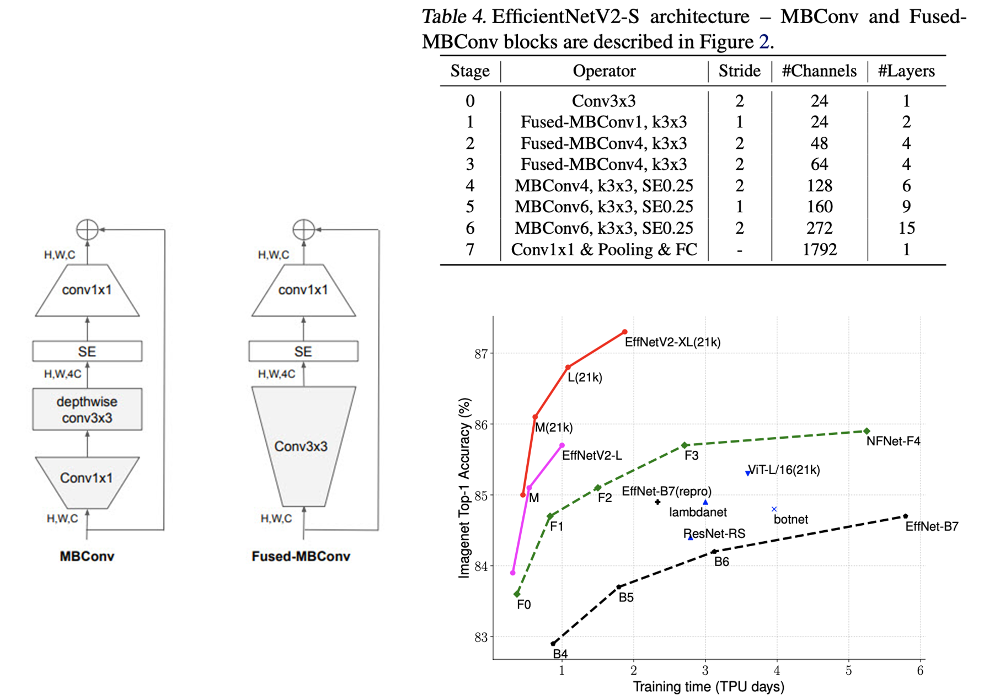